In [1]:
import os
import io
import boto3
import os.path
import json
import glob
import subprocess
import pandas as pd
import random
import torch
import requests
import faiss
import numpy as np
from tqdm import tqdm
from PIL import Image
from datetime import datetime
from transformers import AutoImageProcessor, ViTModel
import matplotlib.pyplot as plt
%matplotlib inline

In [2]:
s3_client = boto3.client('s3')
bucket = 'reddit-meme-img'

## Inference on Reddit Data

In [3]:
index = faiss.read_index('graph/out/imkg_index.index')
index_dict = np.load('graph/out/imkg_img_index_dict.npy', allow_pickle=True).item()
category_index_dict = np.load('graph/out/imkg_img_category_index_dict.npy', allow_pickle=True).item()
url_index_dict = np.load('graph/out/imkg_img_url_index_dict.npy', allow_pickle=True).item()

In [4]:
processor = AutoImageProcessor.from_pretrained("google/vit-base-patch16-224-in21k")
model = ViTModel.from_pretrained("google/vit-base-patch16-224-in21k")

In [9]:
# get all csv files and then concatenate all images for encoding purpose
directory_path = "./data/final_files"
csv_files = glob.glob(os.path.join(directory_path, "*_transformed.csv"))
all_test_images = []
for file in tqdm(csv_files):
    test_df = pd.read_csv(file)
    test_urls = list(test_df['image_location'].values)
    test_url = [x for x in test_urls if pd.notnull(x)]
    all_test_images.append(test_url)
all_test_images = [item for sublist in all_test_images for item in sublist]

100%|████████████████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 34.65it/s]


In [3]:
len(all_test_images)

13145

In [37]:
test_images = all_test_images
k = 1
sample_test = []
for i in tqdm(range(len(test_images))):
    try:
        file_byte_string = s3_client.get_object(Bucket=bucket, Key=test_images[i])['Body'].read()
        img_loc=test_images[i]
        image = Image.open(io.BytesIO(file_byte_string))
        if test_images[i].endswith(".gif"):
            image = image.convert("RGB")
        inputs = processor(images=image, return_tensors="pt")
        with torch.no_grad():
            outputs = model(**inputs)
            ftr = outputs.last_hidden_state
        ftr = ftr.reshape(1, -1)
        ftr_np = ftr.detach().cpu().numpy()
        faiss.normalize_L2(ftr_np)
        D, I = index.search(np.expand_dims(ftr_np[0], axis=0), k)
        sample_test.append((img_loc, url_index_dict[I[0][0]], D))
    except Exception as e:
        pass

 26%|███████████████████████                                                                 | 3449/13145 [33:39<2:14:20,  1.20it/s]/nas/home/syjoshi/miniconda3/envs/imkg/lib/python3.8/site-packages/PIL/Image.py:3176: DecompressionBombWarning: Image size (93131775 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  warnings.warn(
 76%|██████████████████████████████████████████████████████████████████▎                    | 10017/13145 [1:37:32<28:49,  1.81it/s]/nas/home/syjoshi/miniconda3/envs/imkg/lib/python3.8/site-packages/PIL/Image.py:3176: DecompressionBombWarning: Image size (139523344 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  warnings.warn(
100%|███████████████████████████████████████████████████████████████████████████████████████| 13145/13145 [2:09:33<00:00,  1.69it/s]


In [38]:
len(sample_test)

11497

In [39]:
val1 = [x[0] for x in sample_test]
val2 = [x[1] for x in sample_test]
val3 = [x[2] for x in sample_test]

In [135]:
# nrows, ncols = 10, 2
# fig, axes = plt.subplots(nrows, ncols, figsize=(20, 50))
# image1, image2 = "", "" 
# for i in range(10):
#     if pd.notna(val1[i]):
#         image1 = Image.open(val1[i])
#         axes[i, 0].imshow(image1)
#         axes[i, 0].axis('off')
#     if pd.notna(val2[i]):
#         image2 = Image.open(requests.get(val2[i], stream=True).raw)
#         axes[i, 1].imshow(image2)
#         axes[i, 1].axis('off')
    
# plt.tight_layout()
# plt.show()

In [40]:
reddit_inference_df = pd.DataFrame(columns=["reddit image", "imkg image", "score"])

In [41]:
for x, y, z in tqdm(zip(val1, val2, val3)):
    reddit_inference_df.loc[len(reddit_inference_df)] = [x, y, z[0][0]]
    
reddit_inference_df.to_csv('./out/reddit_inference_final.csv')

11497it [00:11, 967.83it/s]


In [43]:
reddit_inference_df.sample(5)

,reddit image,imkg image,score
4799,HistoryMemes/gybpvlloy6fb1.png,https://i.imgflip.com/28bl28.jpg,0.454944
6694,memes/wtqs4larykcb1.gif,https://i.imgflip.com/3bccys.jpg,0.313279
9101,memes/bd9asah828eb1.png,https://i.imgflip.com/2680dn.jpg,0.699140
4015,HistoryMemes/83xp692qtkcb1.jpg,https://i.imgflip.com/3eq0wv.jpg,0.482019
8047,memes/31vjxftrmldb1.jpg,https://i.imgflip.com/44u5fm.jpg,0.740984


In [44]:
reddit_inference_df.shape

(11497, 3)

## Filter data by score

In [7]:
reddit_inference_df = pd.read_csv('./out/reddit_inference_final.csv', index_col=0)

In [46]:
def filter_data(df, filter_score):
    filtered_df = df[df['score']>=filter_score]
    filtered_df.reset_index(drop=True, inplace=True)
    return filtered_df

In [47]:
filter_score = 0.50
filtered_df_50 = filter_data(reddit_inference_df, filter_score)
filtered_df_50.to_csv('./out/filtered_df_50_final.csv')
filtered_df_50.shape

(3121, 3)

In [48]:
filter_score = 0.60
filtered_df_60 = filter_data(reddit_inference_df, filter_score)
filtered_df_60.to_csv('./out/filtered_df_60_final.csv')
filtered_df_60.shape

(2074, 3)

In [49]:
filter_score = 0.70
filtered_df_70 = filter_data(reddit_inference_df, filter_score)
filtered_df_70.to_csv('./out/filtered_df_70_final.csv')
filtered_df_70.shape

(1237, 3)

In [50]:
filter_score = 0.90
filtered_df_90 = filter_data(reddit_inference_df, filter_score)
filtered_df_90.to_csv('./out/filtered_df_90_final.csv')
filtered_df_90.shape

(129, 3)

## Plot filtered data - potential match

In [59]:
def plot_match_data(max_len, images1, images2):
    nrows, ncols = min(10, max_len), 2
    fig, axes = plt.subplots(nrows, ncols, figsize=(20, 50))
    image1, image2 = "", "" 
    for i in range(min(10, max_len)):
        file_byte_string = s3_client.get_object(Bucket=bucket, Key=images1[i])['Body'].read()
        image1 = Image.open(io.BytesIO(file_byte_string))
        axes[i, 0].imshow(image1)
        axes[i, 0].axis('off')
        image2 = Image.open(requests.get(images2[i], stream=True).raw)
        axes[i, 1].imshow(image2)
        axes[i, 1].axis('off')

    plt.tight_layout()
    plt.show()

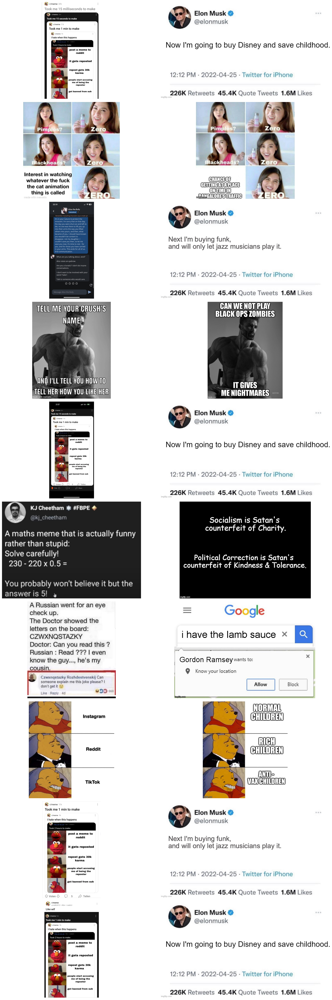

In [60]:
filtered_df = pd.read_csv('./out/filtered_df_50_final.csv')
images1 = list(filtered_df['reddit image'].values)
images2 = list(filtered_df['imkg image'].values)
plot_match_data(len(filtered_df), images1, images2)

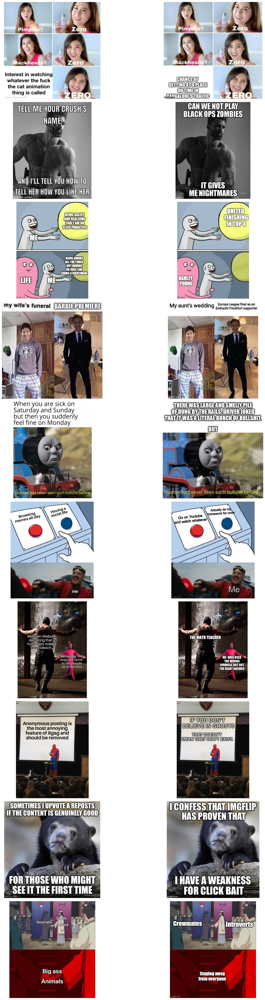

In [61]:
filtered_df = pd.read_csv('./out/filtered_df_70_final.csv')
images1 = list(filtered_df['reddit image'].values)
images2 = list(filtered_df['imkg image'].values)
plot_match_data(len(filtered_df), images1, images2)

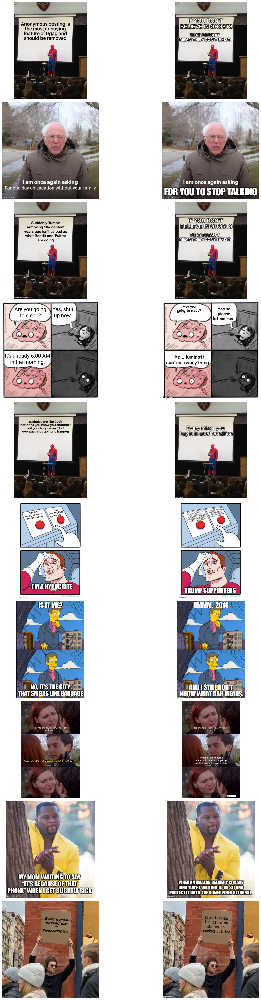

In [63]:
filtered_df = pd.read_csv('./out/filtered_df_90_final.csv')
images1 = list(filtered_df['reddit image'].values)
images2 = list(filtered_df['imkg image'].values)
plot_match_data(len(filtered_df), images1, images2)